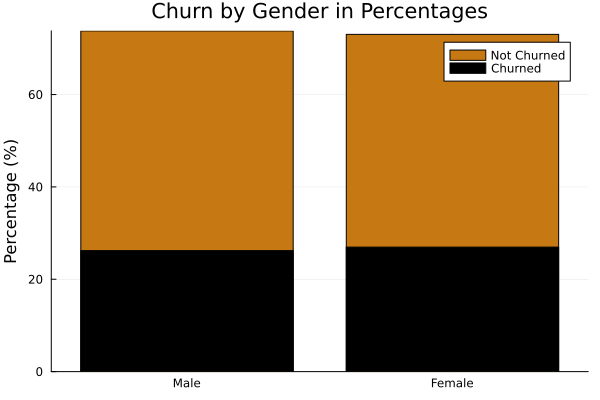

"C:\\Users\\ALEKHYA\\Downloads\\Churn_prediction_project\\Distribution_of_Gender.png"

In [2]:
using CSV, DataFrames, Plots

# Load your data
df = CSV.read("telco_cleaned.csv", DataFrame)

grouped = combine(groupby(df, [:gender, :churn_value]), nrow => :count)

# Pivot the table to have churn_values as columns
pivot_df = unstack(grouped, :gender, :churn_value, :count, fill=0)

not_churned_col = Symbol("0") 
churned_col = Symbol("1") 

pivot_df[!, :Not_Churned] = (pivot_df[!, not_churned_col] ./ (pivot_df[!, not_churned_col] + pivot_df[!, churned_col])) * 100
pivot_df[!, :Churned] = (pivot_df[!, churned_col] ./ (pivot_df[!, not_churned_col] + pivot_df[!, churned_col])) * 100

# Plot
p = bar(pivot_df.gender, [pivot_df.Not_Churned pivot_df.Churned], 
        label=["Not Churned" "Churned"], 
        stacked=true, 
        color=["#C67812" :black], 
        ylabel="Percentage (%)", 
        title="Churn by Gender in Percentages",
        legend=:topright)
display(p)

savefig(p, "Distribution_of_Gender.png")

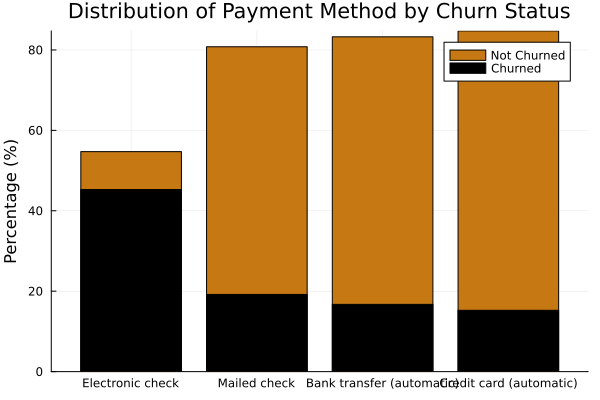

"C:\\Users\\ALEKHYA\\Downloads\\Churn_prediction_project\\Distribution_of_payment_method.png"

In [3]:
using CSV, DataFrames, Plots

# Load your data
df = CSV.read("telco_cleaned.csv", DataFrame)

# Group and count by payment method and churn value
grouped = combine(groupby(df, [:payment_method, :churn_value]), nrow => :count)

# Pivot the table to have churn_values as columns
pivot_df = unstack(grouped, :payment_method, :churn_value, :count, fill=0)

# Assuming churn values are "Yes" and "No" in your dataset
not_churned_col = Symbol("0") 
churned_col = Symbol("1")

# Calculate the percentages
pivot_df[!, :Not_Churned] = (pivot_df[!, not_churned_col] ./ (pivot_df[!, not_churned_col] + pivot_df[!, churned_col])) * 100
pivot_df[!, :Churned] = (pivot_df[!, churned_col] ./ (pivot_df[!, not_churned_col] + pivot_df[!, churned_col])) * 100

# Sort by Not Churned percentage (optional)
sort!(pivot_df, :Not_Churned)

# Plot
p = bar(pivot_df.payment_method, [pivot_df.Not_Churned pivot_df.Churned], 
        label=["Not Churned" "Churned"], 
        stacked=true, 
        color=["#C67812" :black], 
        ylabel="Percentage (%)", 
        title="Distribution of Payment Method by Churn Status",
        legend=:topright)
display(p)

# Save the plot to a file
savefig(p, "Distribution_of_payment_method.png")


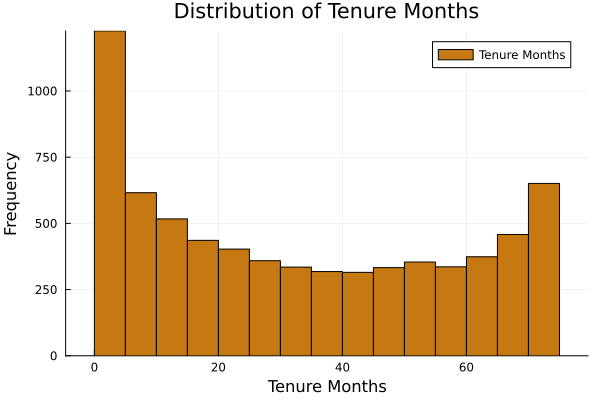

"C:\\Users\\ALEKHYA\\Downloads\\Churn_prediction_project\\tenure_months_histogram.png"

In [4]:
p_tenure = Plots.histogram(df.tenure_months, bins=30, label="Tenure Months", 
                     xlabel="Tenure Months", ylabel="Frequency", 
                     title="Distribution of Tenure Months", 
                     color="#C67812")
display(p_tenure)
savefig(p_tenure, "tenure_months_histogram.png")

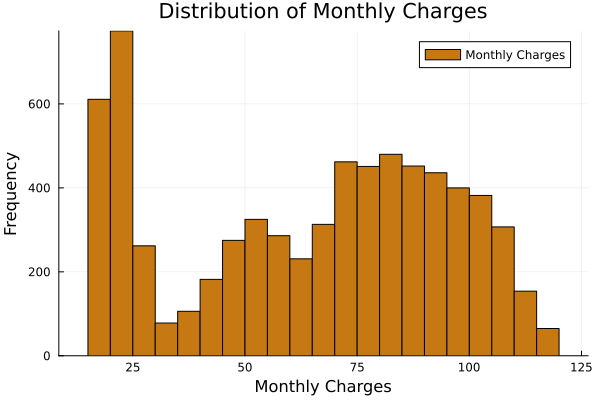

In [5]:
p_monthly_charges = histogram(df.monthly_charges, bins=30, label="Monthly Charges", 
                              xlabel="Monthly Charges", ylabel="Frequency", 
                              title="Distribution of Monthly Charges", 
                              color="#C67812")
display(p_monthly_charges)

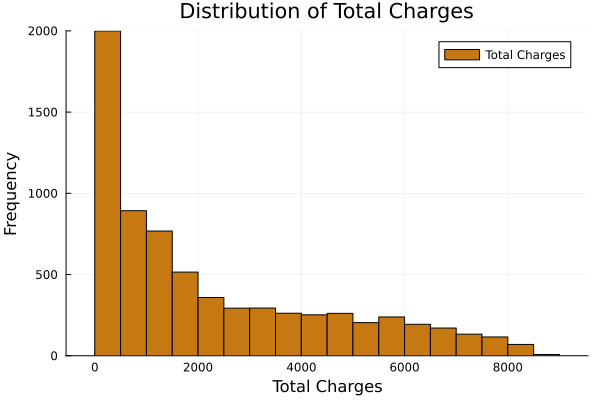

"C:\\Users\\ALEKHYA\\Downloads\\Churn_prediction_project\\Total_Charges.png"

In [6]:

p_total_charges = histogram(df.total_charges, bins=30, label="Total Charges", 
                            xlabel="Total Charges", ylabel="Frequency", 
                            title="Distribution of Total Charges", 
                            color="#C67812")
display(p_total_charges)

savefig(p_total_charges, "Total_Charges.png")

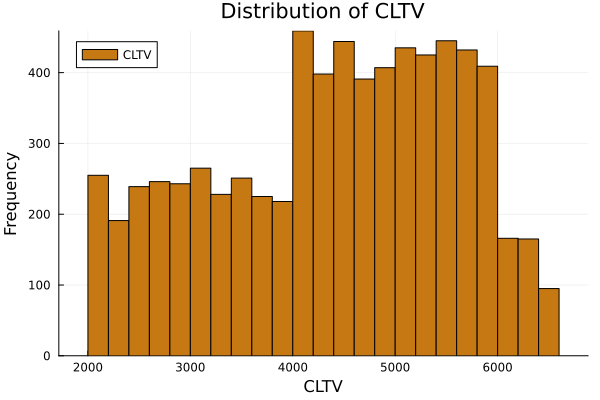

In [7]:

p_cltv = histogram(df.cltv, bins=30, label="CLTV", 
                   xlabel="CLTV", ylabel="Frequency", 
                   title="Distribution of CLTV", 
                   color="#C67812")
display(p_cltv)

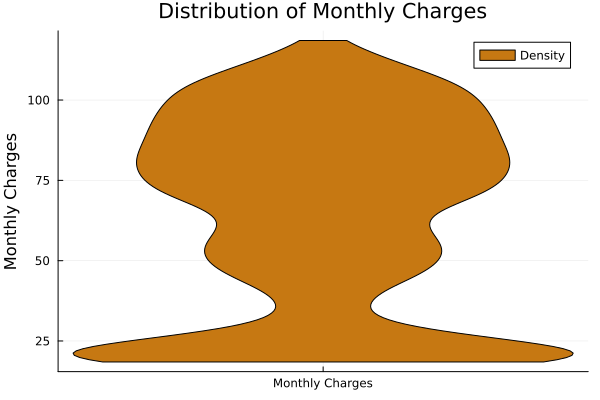

"C:\\Users\\ALEKHYA\\Downloads\\Churn_prediction_project\\monthly_charges_violin.png"

In [11]:
gr() 

# Create a violin plot for monthly_charges
p_monthly_charges_violin = violin(["Monthly Charges"], df.monthly_charges, 
                                   color="#C67812", 
                                   label="Density",
                                   xlabel="",
                                   ylabel="Monthly Charges", 
                                   title="Distribution of Monthly Charges")

# Display the plot
display(p_monthly_charges_violin)

# Save the plot if needed
savefig(p_monthly_charges_violin, "monthly_charges_violin.png")


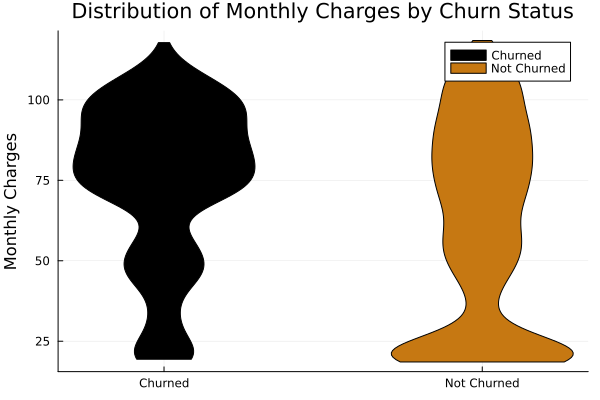

In [12]:

gr() 

# Create separate groups for churned and not churned customers
churned = df[df.churn_value .== 1, :]
not_churned = df[df.churn_value .== 0, :]

# Plot these as separate groups in the violin plot
p = violin(["Churned"], churned.monthly_charges, color = "black", label = "Churned")
violin!(["Not Churned"], not_churned.monthly_charges, color = "#C67812", label = "Not Churned")

# Set labels and title
xlabel!(p, "")
ylabel!(p, "Monthly Charges")
title!(p, "Distribution of Monthly Charges by Churn Status")

# Display the plot
display(p)


In [13]:

using Pkg
Pkg.add("PlotlyJS")

   Resolving package versions...
   Installed Hiccup ──────────────── v0.2.2
   Installed AssetRegistry ───────── v0.1.0
   Installed Pidfile ─────────────── v1.3.0
   Installed PlotlyBase ──────────── v0.8.21
   Installed PlotlyKaleido ───────── v2.3.0
   Installed Lazy ────────────────── v0.15.1
   Installed WebSockets ──────────── v1.6.0
   Installed JSExpr ──────────────── v0.5.4
   Installed Kaleido_jll ─────────── v0.2.1+0
   Installed Mustache ────────────── v1.0.21
   Installed Blink ───────────────── v0.12.9
   Installed FunctionalCollections ─ v0.5.0
   Installed PlotlyJS ────────────── v0.18.17
   Installed WebIO ───────────────── v0.8.21
   Installed Mux ─────────────────── v1.0.2
  Installing 8 artifacts
   Installed artifact web                   215.6 KiB
   Installed artifact mathjax               18.7 KiB
   Installed artifact plotly-base-artifacts 430.0 KiB
   Installed artifact plotly-artifacts      1.7 MiB
   Installed artifact plotly                2.3 MiB
   Insta

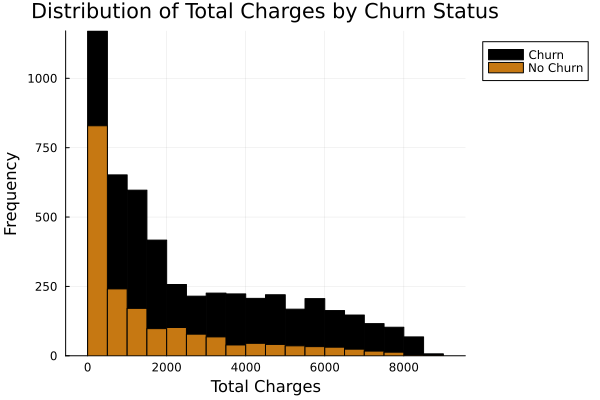

"C:\\Users\\ALEKHYA\\Downloads\\Churn_prediction_project\\Total_Charges_Churn_Status.png"

In [14]:

p1 = @df df histogram(:total_charges, group=:churn_value, bins=30, 
                      color=[:black "#C67812"], legend=:outertopright,
                      xlabel="Total Charges", ylabel="Frequency", 
                      title="Distribution of Total Charges by Churn Status",
                      labels=["Churn" "No Churn"])

# Display the plot
display(p1)

savefig(p1, "Total_Charges_Churn_Status.png")

In [15]:
Pkg.add("CategoricalArrays")

   Resolving package versions...
     Project No packages added to or removed from `C:\Users\ALEKHYA\Downloads\Churn_prediction_project\Project.toml`
    Manifest No packages added to or removed from `C:\Users\ALEKHYA\Downloads\Churn_prediction_project\Manifest.toml`


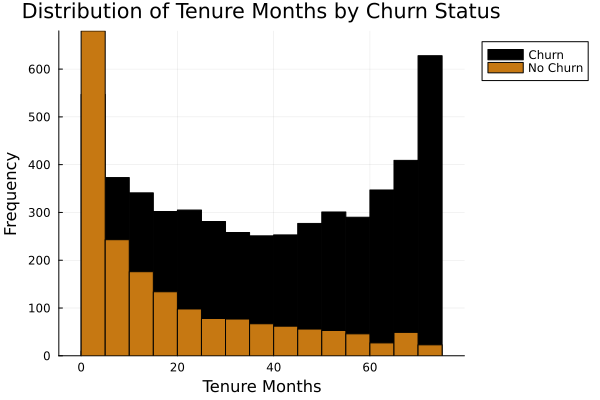

"C:\\Users\\ALEKHYA\\Downloads\\Churn_prediction_project\\Tenure_Months_Churn_Status.png"

In [16]:

# Create a histogram for tenure_months grouped by churn_value
# Specifying colors and labels for clarity
p2 = @df df Plots.histogram(:tenure_months, group=:churn_value, bins=30, 
                      color=[:black "#C67812"], legend=:outertopright,
                      xlabel="Tenure Months", ylabel="Frequency", 
                      title="Distribution of Tenure Months by Churn Status",
                      labels=["Churn" "No Churn"])

# Display the plot
display(p2)
savefig(p2, "Tenure_Months_Churn_Status.png")

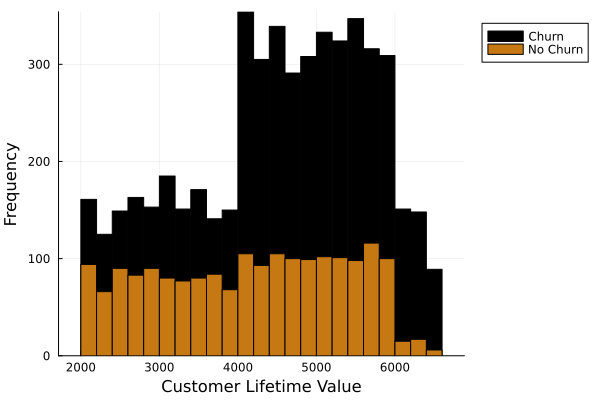

"C:\\Users\\ALEKHYA\\Downloads\\Churn_prediction_project\\CLTV_Status.png"

In [17]:
# Create a histogram for tenure_months grouped by churn_value
# Specifying colors and labels for clarity
p2 = @df df Plots.histogram(:cltv, group=:churn_value, bins=30, 
                      color=[:black "#C67812"], legend=:outertopright,
                      xlabel="Customer Lifetime Value", ylabel="Frequency", 
                      title="",
                      labels=["Churn" "No Churn"])

# Display the plot
display(p2)
savefig(p2, "CLTV_Status.png")

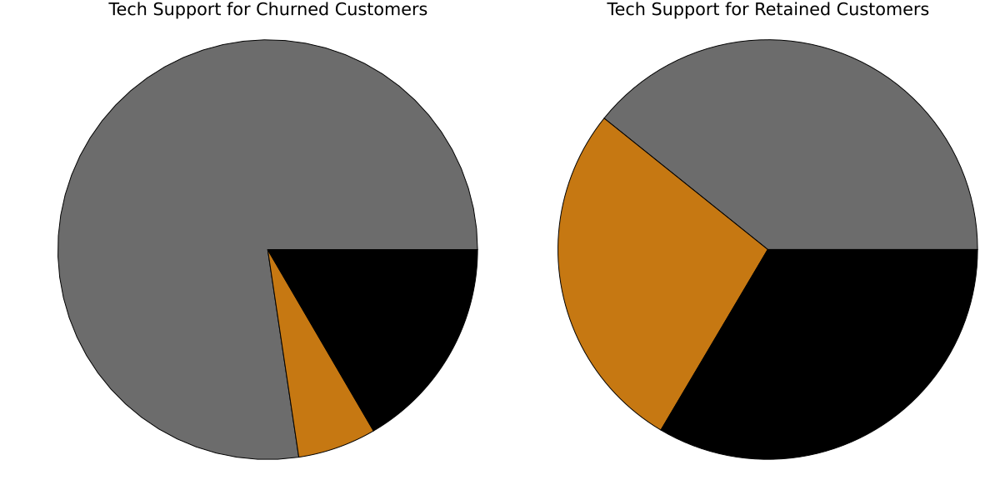

In [29]:
using DataFrames, CategoricalArrays
import Plots                      # don't bring all names; use qualified calls
Plots.gr()                        # optional: pick GR backend

df.tech_support = categorical(df.tech_support)

colors = ["#6c6c6c", "#c67812", "black"]

agg_df = combine(groupby(df, [:tech_support, :churn_value]), nrow => :Count)
churn_yes_df = filter(:churn_value => ==(1), agg_df)
churn_no_df  = filter(:churn_value => ==(0), agg_df)

labels = ["No", "Yes", "No internet service"]

p1 = Plots.pie(churn_yes_df.tech_support, churn_yes_df.Count;
               labels=labels, title="Tech Support for Churned Customers",
               legend=false, color=colors)

p2 = Plots.pie(churn_no_df.tech_support, churn_no_df.Count;
               labels=labels, title="Tech Support for Retained Customers",
               legend=false, color=colors)

Plots.plot(p1, p2; layout=(1, 2), size=(1200, 600))


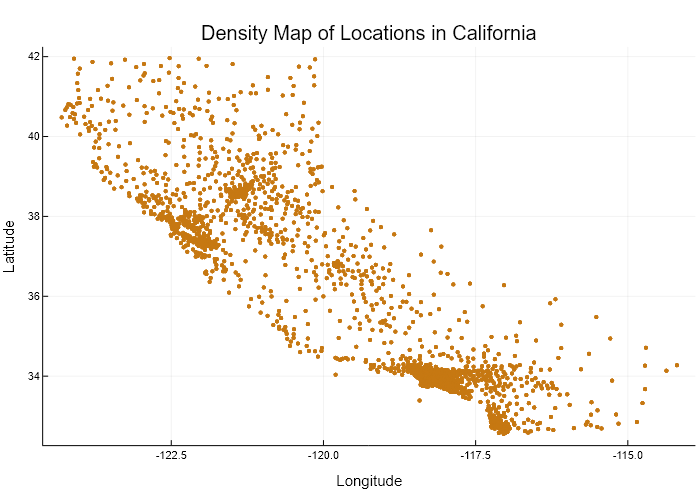

In [21]:

using CSV, DataFrames, Plots, PlotlyJS

# Load the data
df = CSV.read("telco_cleaned.csv", DataFrame)

# Extract the latitude and longitude data
lats = df[:, :latitude]
longs = df[:, :longitude]

# Switch to PlotlyJS for an interactive backend
Plots.plotlyjs()

# Plot the density map with latitude and longitude data
density_map = Plots.scatter(longs, lats, 
                            markersize=2, 
                            markerstrokewidth=0, 
                            markerstrokealpha=0, 
                            markercolor="#c67812", 
                            title="Density Map of Locations in California", 
                            xlabel="Longitude", 
                            ylabel="Latitude", 
                            legend=false)

# Display the plot
display(density_map)

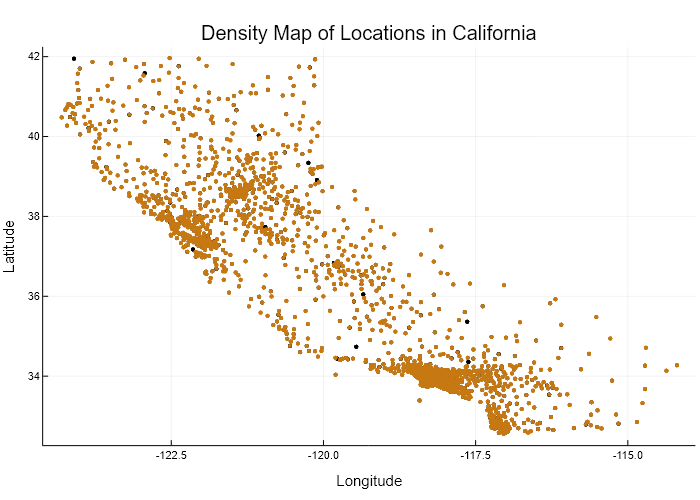

In [22]:


using CSV, DataFrames, Plots, PlotlyJS

# Load the data
df = CSV.read("telco_cleaned.csv", DataFrame)

# Extract the latitude and longitude data
lats = df[:, :latitude]
longs = df[:, :longitude]

# Switch to PlotlyJS for an interactive backend
Plots.plotlyjs()

# Assign colors based on churn_value: black for churn_value == 1, #c67812 for the rest
colors = [churn == 1 ? "black" : "#c67812" for churn in df[:, :churn_value]]

# Plot the density map with latitude and longitude data
density_map = Plots.scatter(longs, lats, 
                            markersize=2, 
                            markerstrokewidth=0, 
                            markerstrokealpha=0, 
                            markercolor=colors,  # Apply the conditional colors
                            title="Density Map of Locations in California", 
                            xlabel="Longitude", 
                            ylabel="Latitude", 
                            legend=false)

# Display the plot
display(density_map)

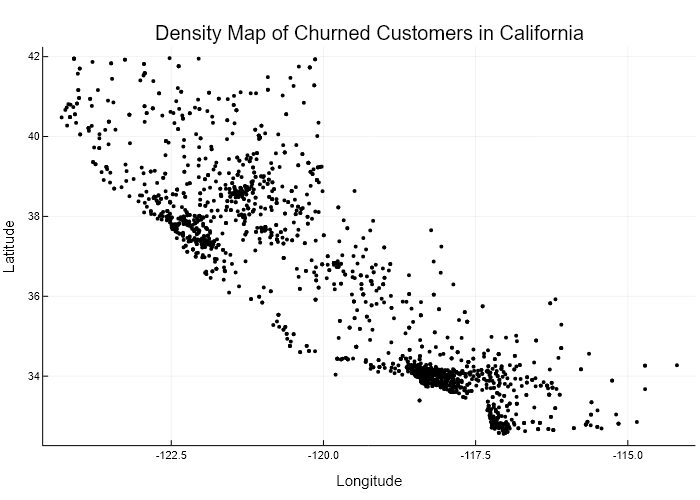

In [23]:
using CSV, DataFrames, Plots, PlotlyJS

# Assuming 'df' is your DataFrame and is already loaded with the necessary data
# If not, load the data using CSV.read

# Filter the DataFrame for rows where churn_value == 1
churned_df = filter(row -> row.churn_value == 1, df)

# Extract the latitude and longitude data for churned customers
churned_lats = churned_df[:, :latitude]
churned_longs = churned_df[:, :longitude]

# Plot the density map with latitude and longitude data for churned customers
churned_density_map = Plots.scatter(churned_longs, churned_lats, 
                                    markersize=2, 
                                    markerstrokewidth=0, 
                                    markerstrokealpha=0, 
                                    markercolor="black", 
                                    title="Density Map of Churned Customers in California", 
                                    xlabel="Longitude", 
                                    ylabel="Latitude", 
                                    legend=false)

# Display the plot
display(churned_density_map)